In [1]:
import numpy as np
import os
import glob
from matplotlib import pyplot as plt

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


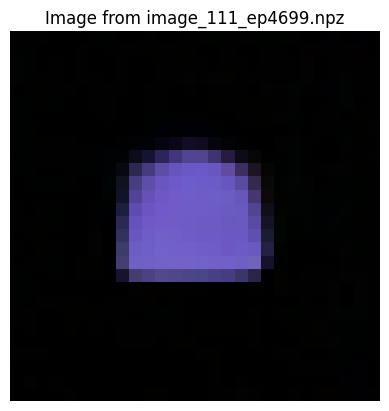

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


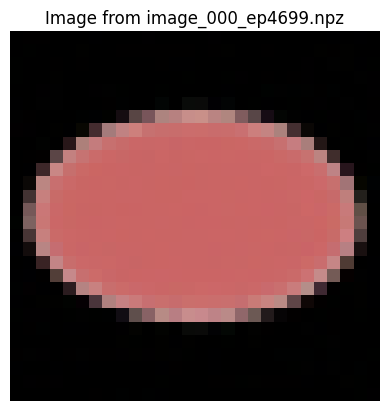

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


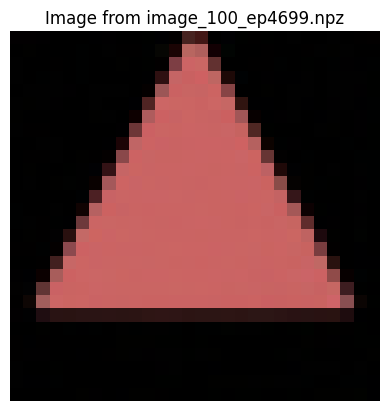

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


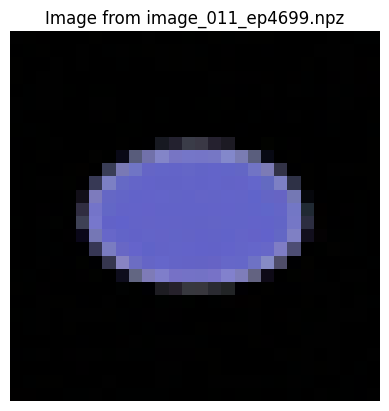

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


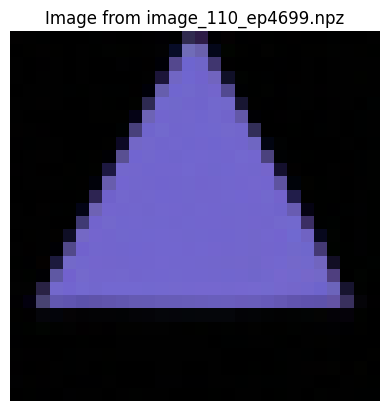

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


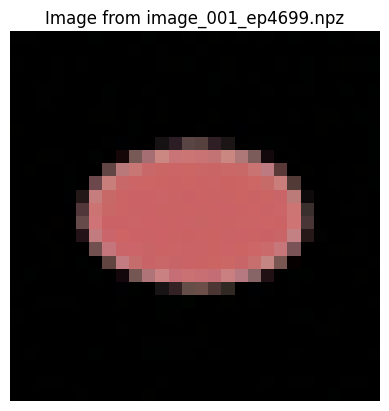

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


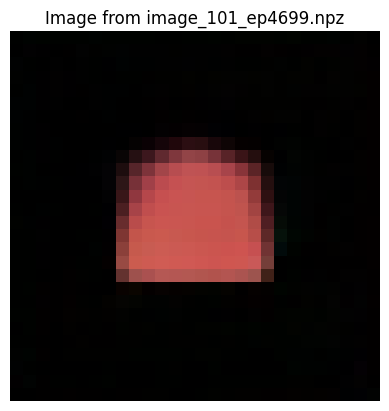

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(64, 3, 28, 28)


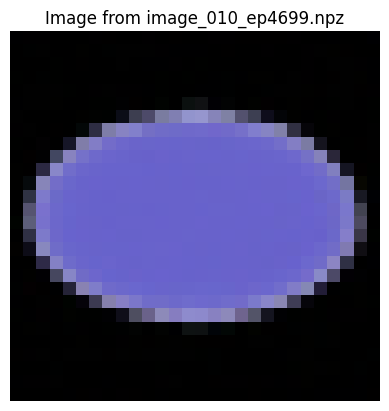

In [5]:
#remove padding:
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/single-body_2d_3classes/DiT/latent/continuous/MG_500_padding/H32-train1/04-05-00-35_5000_1.6_256_1000_6000_0.0001_None_1500_2.0_1'
#with a new seed 
#dir_path = '/work/dlclarge2/aliy-maskgit/maskgit/results/output_all/single-body_2d_3classes/pixel/discrete/new_seed_diffusion_real/H32-train1/03-05-22-47_5000_1.6_256_500_6000_0.0001_None_1500_2.0_42'
# dir_path = '/work/dlclarge2/aliy-maskgit/maskgit/results/output_all/single-body_2d_3classes/pixel/discrete/first_run/H32-train1/03-05-13-19_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
#dir_path = '/work/dlclarge2/aliy-maskgit/maskgit/results/output_all/single-body_2d_3classes/pixel/discrete/maskgit_run/H32-train1/03-05-14-11_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
# Loop over all files in the directory
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        #print(data)
        #get the number between ep and .npz
        ep = filename.split('ep')[1].split('.npz')[0]
        #print(f'Epoch: {ep}')
        #print(f'File: {filename}, data: {data.files}, shape:{data[data.files[0]].shape}')
        # Assuming the .npz file contains only one array
        array_name = data.files[0] 
        if  array_name == 'x_gen' and int(ep) == 4699:
            print(data[array_name].shape)
            # Assuming the array is 3D (e.g., 1xHxWxC)
            image_array = data[array_name][0].transpose(1, 2, 0)
            #print(f'Image max: {np.max(image_array)}, min: {np.min(image_array)}')
            #Display the image
            plt.imshow(image_array)
            plt.title(f'Image from {filename}')
            plt.axis('off')
            plt.show()

In [4]:
#dir_path = 'output/single-body_2d_3classes/latent_None/H32-train1/20-03-10-32_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
#dir_path = 'output/single-body_2d_3classes/latent_None/H32-train1/20-03-01-51_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
dir_path = 'results/output/single-body_2d_3classes/latent_None/H32-train1/25-03-08-48_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
save_dir = 'new_output'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
# Loop over all files in the directory
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        #print(data)
        #get the number between ep and .npz
        ep = filename.split('ep')[1].split('.npz')[0]
        #print(f'Epoch: {ep}')
        #print(f'File: {filename}, data: {data.files}, shape:{data[data.files[0]].shape}')
        # Assuming the .npz file contains only one array
        array_name = data.files[0] 
        if  array_name == 'x_gen' and int(ep) == 4999:
            print(data[array_name].shape)
            # Assuming the array is 3D (e.g., 1xHxWxC)
            image_array = data[array_name][0].transpose(1, 2, 0)
            #print(f'Image max: {np.max(image_array)}, min: {np.min(image_array)}')
            #Display the image
            plt.imshow(image_array, cmap='gray')
            plt.title(f'Image from {filename}')
            plt.axis('off')
            plt.show()
            # Save the image to a file
            save_filename = f'{save_dir}/{filename.replace(".npz", ".png")}'
            #get ranges of the image
            print(f'Image max: {np.max(image_array)}, min: {np.min(image_array)}')
            #clip the image to 0-1
            image_array = np.clip(image_array, 0, 1)
            plt.imsave(save_filename, image_array, cmap='gray')
            break

            plt.close()
            
            

# MPI3D

Config: 331, Number of images: 8


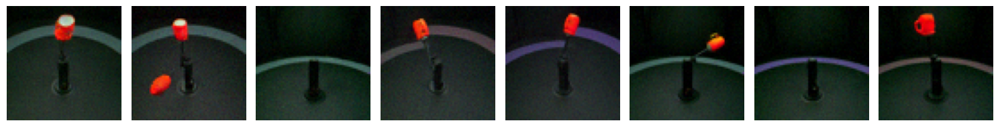

Config: 011, Number of images: 8


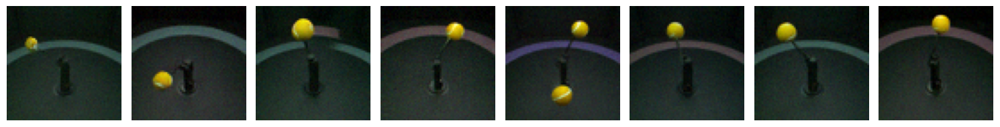

Config: 201, Number of images: 8


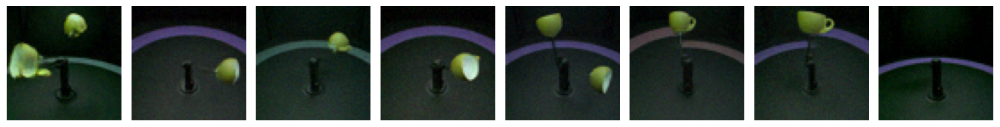

Config: 221, Number of images: 8


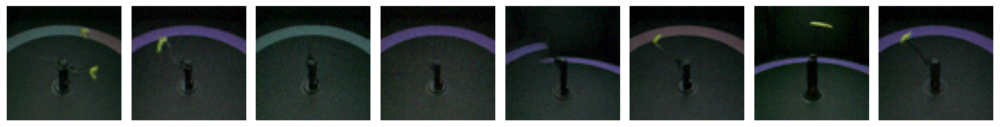

In [28]:
#U-Net 
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/mpi3d_real_complex/U-Net/pixel/continuous/3k_epoch_32_B/mpi3d_16_16/24-04-20-20_5000_1.6_256_500_3000_0.0001_None_1500_2.0_1'
# Loop over all files in the directory
combinat_unet = {"331":[], "011":[], "201":[], "221":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if array_name == 'x_gen' and config in combinat_unet: #and int(ep) == 999:
            image_array = data[array_name][0].transpose(1, 2, 0)
            combinat_unet[config].append(image_array)

for key, images in combinat_unet.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))  # Adjust figsize as needed
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')  # Turn off axes
    plt.tight_layout()
    plt.show()


Config: 331, Number of images: 10


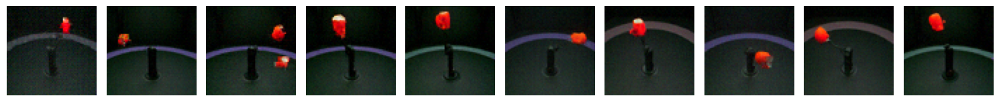

Config: 011, Number of images: 10


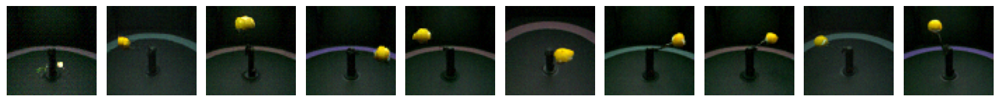

Config: 201, Number of images: 10


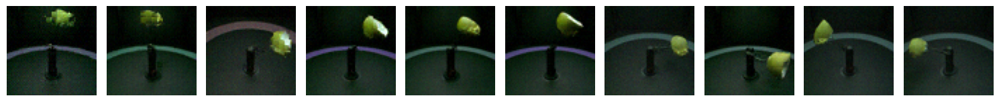

Config: 221, Number of images: 10


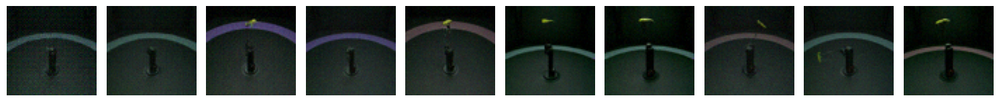

In [29]:
#DiT
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/mpi3d_real_complex/DiT/pixel/discrete/3k_epoch_32_B/mpi3d_16_16/25-04-01-47_5000_1.6_256_500_3000_0.0001_None_1500_2.0_1'
# Loop over all files in the directory
combinat = {"331":[], "011":[], "201":[], "221":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if array_name == 'x_gen' and config in combinat: #and int(ep) == 999:
            image_array = data[array_name][0].transpose(1, 2, 0)
            combinat[config].append(image_array)
for key, images in combinat.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))  # Adjust figsize as needed
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')  # Turn off axes
    plt.tight_layout()
    plt.show()


# CelebA
- Gender: 0 -> man , 1 -> female  
- Facial expression: 0 -> smiling, 1 -> not smiling 
- Hair color: 0 -> black hair, 1 -> blonde hair

## U-Net

Config: 000, Number of images: 10


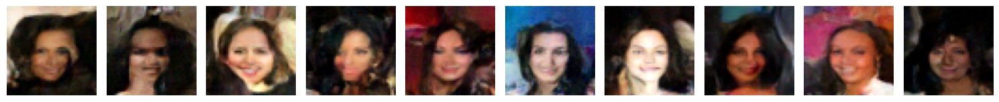

Config: 001, Number of images: 10


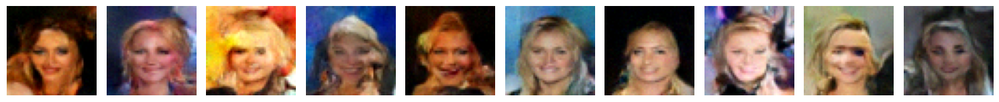

Config: 100, Number of images: 10


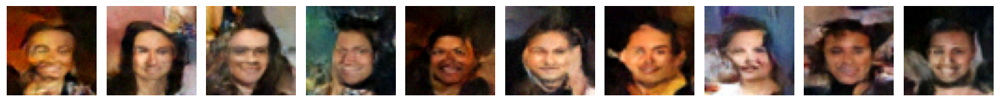

Config: 010, Number of images: 10


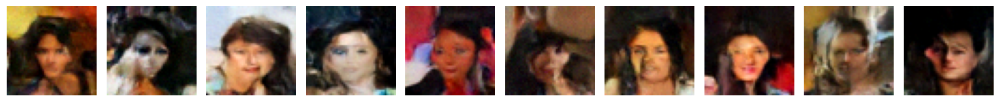

Config: 110, Number of images: 10


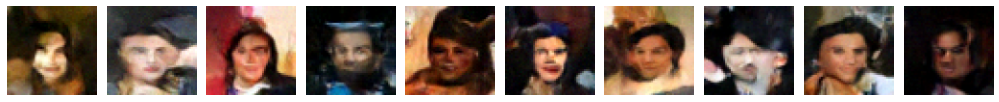

Config: 011, Number of images: 10


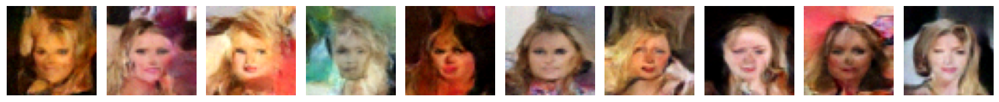

Config: 101, Number of images: 10


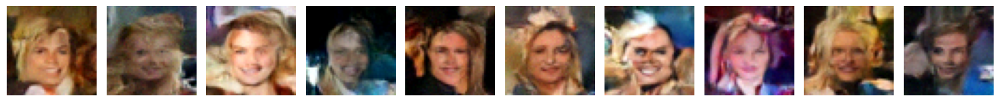

Config: 111, Number of images: 10


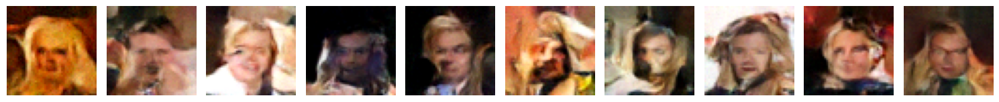

In [3]:
###################################### U-Net pixel replicated #####################################
dir_path = 'results/output_all/celeba-3classes-smiling-10000_100/U-Net_replicate/pixel_size_48/H32-train1/5000_1.6_256_500_100_0.0001_None_1500_2.0_1'
celeba_unet = {"000":[], "001":[], "100":[], "010":[],"110":[], "011":[], "101":[], "111":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if int(ep) > 64:
            if array_name == 'x_gen' and config in celeba_unet and len(celeba_unet[config]) < 10: #and int(ep) == 999:
                image_array = data[array_name][0].transpose(1, 2, 0)
                celeba_unet[config].append(image_array)
        
    

for key, images in celeba_unet.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')  # Turn off axes
    plt.tight_layout()
    plt.show()


Config: 000, Number of images: 10


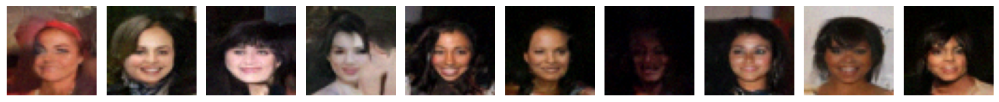

Config: 001, Number of images: 10


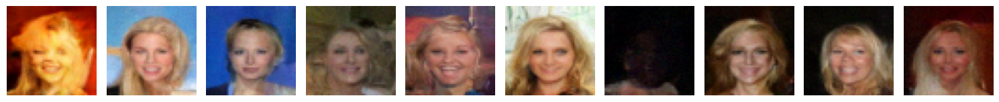

Config: 100, Number of images: 10


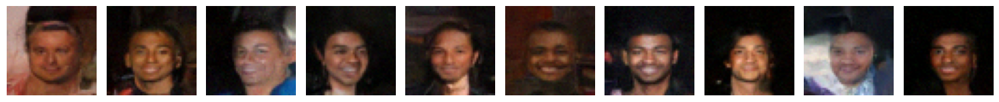

Config: 010, Number of images: 10


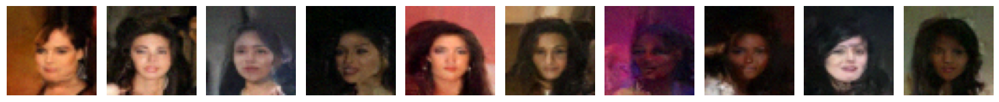

Config: 110, Number of images: 10


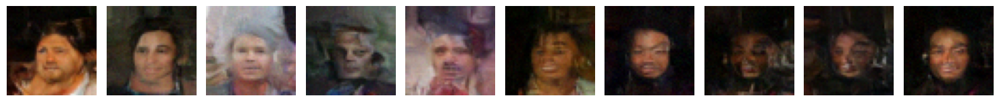

Config: 011, Number of images: 10


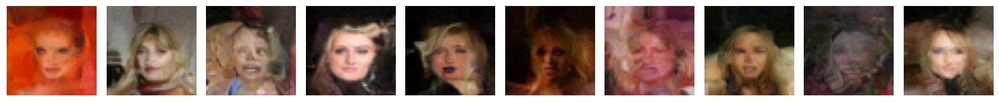

Config: 101, Number of images: 10


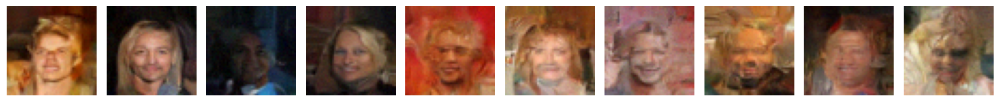

Config: 111, Number of images: 10


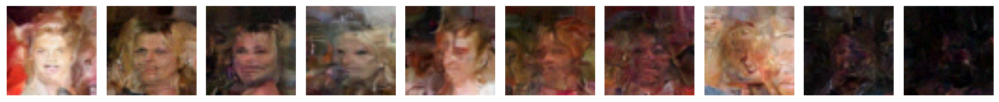

In [4]:
###################################### U-Net pixel more epochs #####################################
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/celeba-3classes-smiling-10000_100/U-Net/pixel/continuous/pixel_48/H32-train1/21-04-00-25_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
celeba_unet_eps = {"000":[], "001":[], "100":[], "010":[],"110":[], "011":[], "101":[], "111":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if int(ep) > 1000:
            if array_name == 'x_gen' and config in celeba_unet_eps and len(celeba_unet_eps[config]) < 10: #and int(ep) == 999:
                image_array = data[array_name][0].transpose(1, 2, 0)
                celeba_unet_eps[config].append(image_array)
        

for key, images in celeba_unet_eps.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5)) 
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()


Config: 000, Number of images: 10


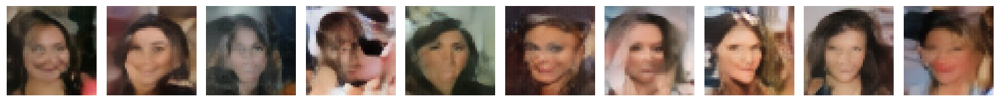

Config: 001, Number of images: 10


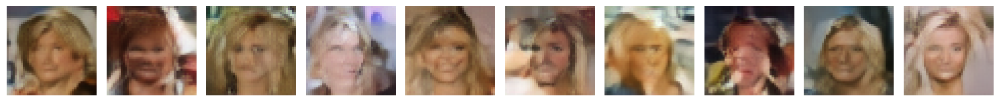

Config: 100, Number of images: 10


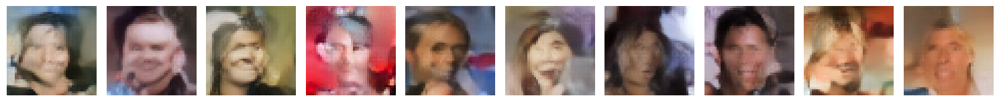

Config: 010, Number of images: 10


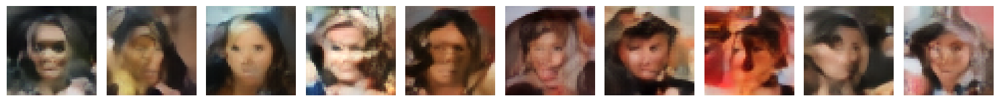

Config: 110, Number of images: 10


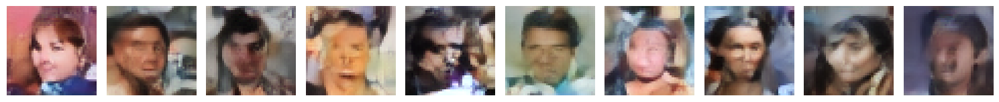

Config: 011, Number of images: 10


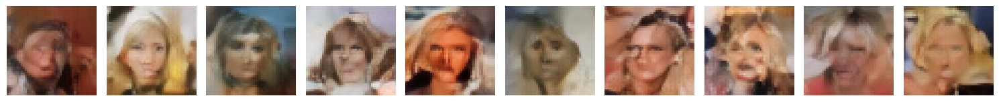

Config: 101, Number of images: 10


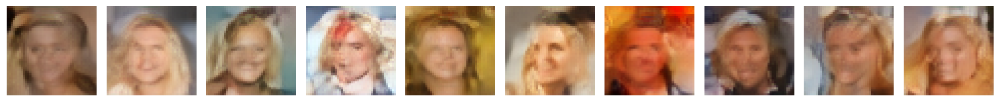

Config: 111, Number of images: 10


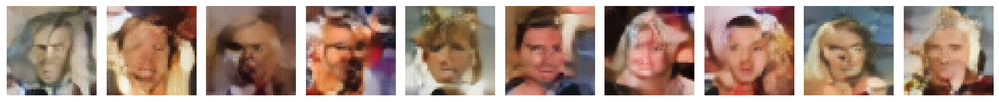

In [5]:
###################################### U-Net pixel more epochs #####################################
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/celeba-3classes-smiling-10000_100/U-Net/latent/continuous/pixel_48/H32-train1/21-04-17-37_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
celeba_unet_latent = {"000":[], "001":[], "100":[], "010":[],"110":[], "011":[], "101":[], "111":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if int(ep) > 4999:
            if array_name == 'x_gen' and config in celeba_unet_latent and len(celeba_unet_latent[config]) < 10: #and int(ep) == 999:
                image_array = data[array_name][0].transpose(1, 2, 0)
                celeba_unet_latent[config].append(image_array)
        

for key, images in celeba_unet_latent.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5)) 
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')  
    plt.tight_layout()
    plt.show()


## DiT 

Config: 000, Number of images: 10


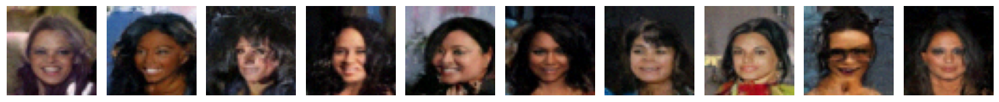

Config: 001, Number of images: 10


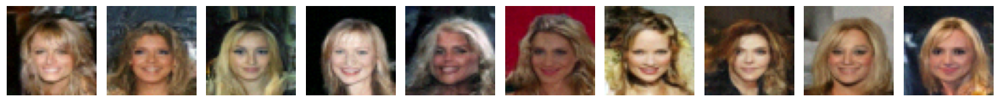

Config: 100, Number of images: 10


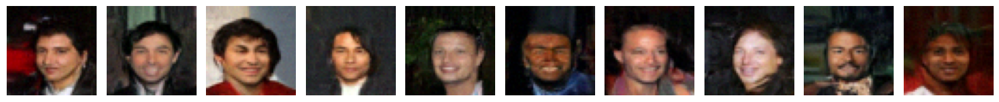

Config: 010, Number of images: 10


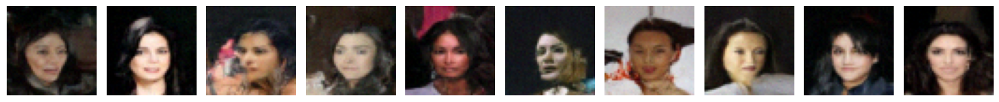

Config: 110, Number of images: 10


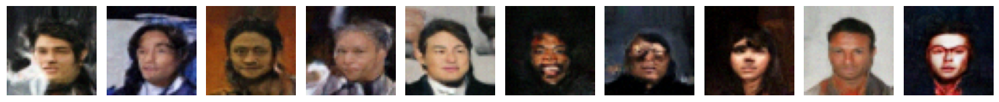

Config: 011, Number of images: 10


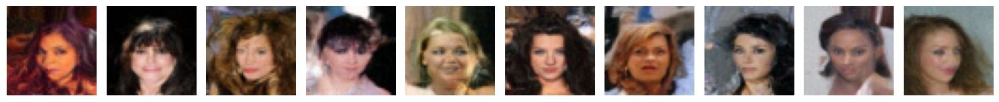

Config: 101, Number of images: 10


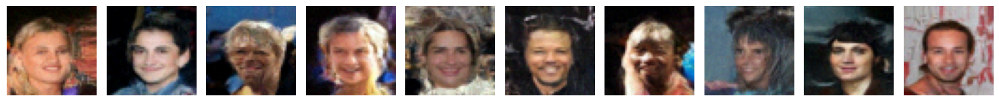

Config: 111, Number of images: 10


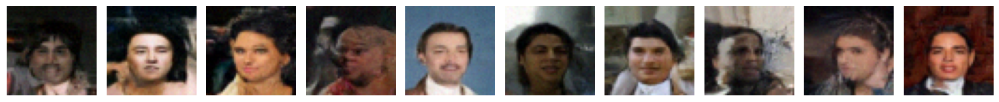

In [6]:
###################################### DiT pixel #####################################
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/celeba-3classes-smiling-10000_100/DiT/pixel/continuous/pixel_48/H32-train1/21-04-00-34_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
celeba_dit_pixel = {"000":[], "001":[], "100":[], "010":[],"110":[], "011":[], "101":[], "111":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if int(ep) > 2000:
            if array_name == 'x_gen' and config in celeba_dit_pixel and len(celeba_dit_pixel[config]) < 10: #and int(ep) == 999:
                image_array = data[array_name][0].transpose(1, 2, 0)
                celeba_dit_pixel[config].append(image_array)
          
for key, images in celeba_dit_pixel.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()


Config: 000, Number of images: 10


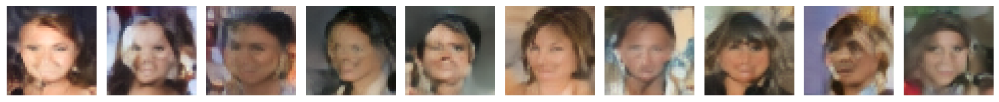

Config: 001, Number of images: 10


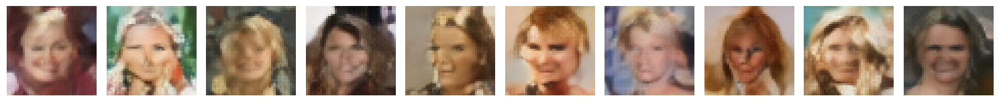

Config: 100, Number of images: 10


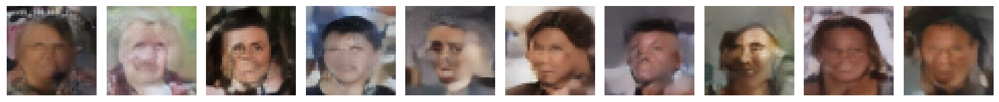

Config: 010, Number of images: 10


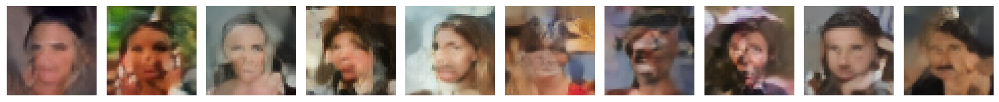

Config: 110, Number of images: 10


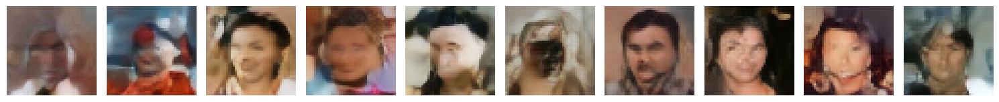

Config: 011, Number of images: 10


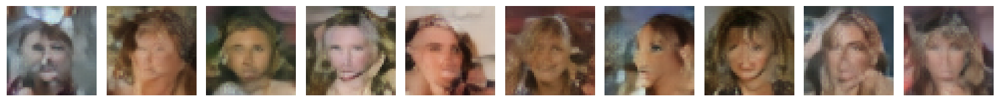

Config: 101, Number of images: 10


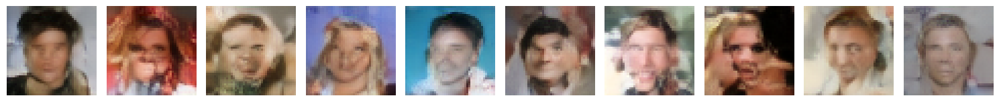

Config: 111, Number of images: 10


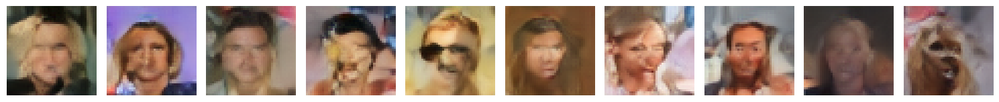

In [ ]:
###################################### DiT latent #####################################
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/celeba-3classes-smiling-10000_100/DiT/latent/continuous/pixel_48/H32-train1/21-04-17-17_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
celeba_dit_latent = {"000":[], "001":[], "100":[], "010":[],"110":[], "011":[], "101":[], "111":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if int(ep) > 1799:
            if array_name == 'x_gen' and config in celeba_dit_latent and len(celeba_dit_latent[config]) < 10: #and int(ep) == 999:
                image_array = data[array_name][0].transpose(1, 2, 0)
                celeba_dit_latent[config].append(image_array)
          
for key, images in celeba_dit_latent.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))  
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')  
    plt.tight_layout()
    plt.show()


In [ ]:
######################################## DiT latent 2 #####################################
dir_path = '/work/dlclarge2/aliy-maskgit/concept_graphs/results/output_all/celeba-3classes-smiling-10000_100/DiT/latent/discrete/DiT_B_4_mg/H32-train1/01-05-12-45_5000_1.6_256_500_6000_0.0001_None_1500_2.0_1'
celeba_dit_latent = {"000":[], "001":[], "100":[], "010":[],"110":[], "011":[], "101":[], "111":[]}
for filename in os.listdir(dir_path):
    if filename.endswith('.npz'):
        data = np.load(os.path.join(dir_path, filename))
        ep = filename.split('ep')[1].split('.npz')[0]
        config = filename.split('_')[1]
        array_name = data.files[0] 
        if int(ep) > 1799:
            if array_name == 'x_gen' and config in celeba_dit_latent and len(celeba_dit_latent[config]) < 10: #and int(ep) == 999:
                image_array = data[array_name][0].transpose(1, 2, 0)
                celeba_dit_latent[config].append(image_array)
          
for key, images in celeba_dit_latent.items():
    print(f'Config: {key}, Number of images: {len(images)}')
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for ax, img in zip(axes, images):
        img = np.clip(img, 0, 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')  
    plt.tight_layout()
    plt.show()
